In [373]:
import xgboost
import shap
import pandas as pd
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_recall_curve, roc_curve
import numpy as np
import matplotlib.pyplot as plt
import plots as plots
import pickle
import lime
import lime.lime_tabular

# Load data and models

In [374]:
data = pickle.load(open('xgb_models/data5.pkl', 'rb'))
model = pickle.load(open('xgb_models/opt_XGB_YN3.pkl', 'rb'))

X_train_target = data['X_train_target']
X_train_target = X_train_target.drop(['4m_Qtncs_m', '4m_Qtncs_s', '4m_Ic_med', '4m_Ic_std'], axis=1)
X_test_target = data['X_test_target']
X_test_target = X_test_target.drop(['4m_Qtncs_m', '4m_Qtncs_s', '4m_Ic_med', '4m_Ic_std'], axis=1)
X = data['X']
X = X.drop(['4m_Qtncs_m', '4m_Qtncs_s', '4m_Ic_med', '4m_Ic_std'], axis=1)

X_train = data['X_train']
X_train = X_train.drop(['4m_Qtncs_m', '4m_Qtncs_s', '4m_Ic_med', '4m_Ic_std'], axis=1)
X_test = data['X_test']
X_test = X_test.drop(['4m_Qtncs_m', '4m_Qtncs_s', '4m_Ic_med', '4m_Ic_std'], axis=1)
X_val = data['X_val']
X_val = X_val.drop(['4m_Qtncs_m', '4m_Qtncs_s', '4m_Ic_med', '4m_Ic_std'], axis=1)
X_all = data['X_all']
X_all = X_all.drop(['4m_Qtncs_m', '4m_Qtncs_s', '4m_Ic_med', '4m_Ic_std'], axis=1)

y_train = data['y_train']
y_test = data['y_test']
y_val = data['y_val']
y = data['y']

## Accuracy

In [375]:
print('Training score: %.2f%%' %(model.score(X_train, y_train) * 100))
print('Testing score: %.2f%%' %(model.score(X_test, y_test) * 100))
print('Overall score: %.2f%%' %(model.score(X_all, y) * 100))

Training score: 88.18%
Testing score: 87.90%
Overall score: 88.19%


pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


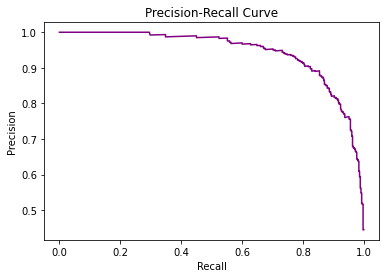

In [376]:
#use logistic regression model to make predictions
y_score = model.predict_proba(X_test)[:, 1]

#calculate precision and recall
precision, recall, thresholds = precision_recall_curve(y_test, y_score)

#create precision recall curve
fig, ax = plt.subplots()
ax.plot(recall, precision, color='purple')

#add axis labels to plot
ax.set_title('Precision-Recall Curve')
ax.set_ylabel('Precision')
ax.set_xlabel('Recall')

#display plot
plt.show()

In [377]:
def plot_roc_cur(fper, tper):  
    plt.plot(fper, tper, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


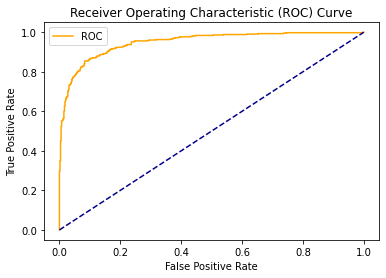

In [378]:
probs = model.predict_proba(X_test)[:, 1]
fper, tper, thresholds = roc_curve(y_test, probs) 
plot_roc_cur(fper, tper)

In [379]:
def plot_summary(idx, shap_values, Xdata):
    shap.plots.waterfall(shap_values[idx])
    plots.prob_barh(model.predict_proba(Xdata)[idx])
    print('Percentile compare to the overall dataset')
    plots.percentile_score(shap_values[idx],Xdata)

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


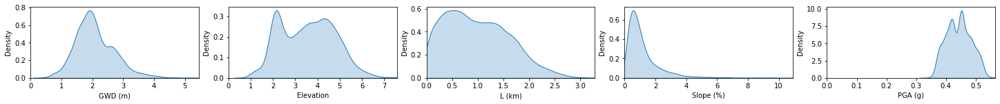

In [380]:
plots.distribution(X_all)

# Local explanations

## Training dataset

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


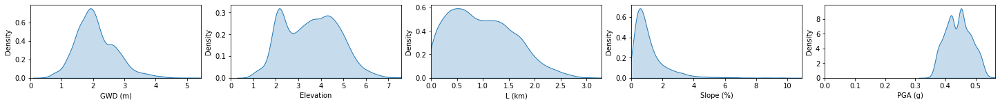

In [381]:
plots.distribution(X_train)

## Case of lateral spreading

In [382]:
# explain the model's predictions using SHAP
# compute SHAP values
explainer = shap.TreeExplainer(model)
shap_values = explainer(X_train)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


In [383]:
feature_names = ['GWD (m)', 'Elevation', 'L (km)', 'Slope (%)', 'PGA (g)']
target_names = ['Lateral Spreading', 'No Lateral Spreading']
lm = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_names, class_names=target_names, discretize_continuous=False)

In [384]:
X_train.reset_index()
X_train_target = X_train_target.reset_index()

In [385]:
X_train_target.loc[X_train_target['Target']==1].loc[X_train_target['L (km)'] < 0.1]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target
26,5829,24517.0,1.885435,2.147271,0.067296,0.171548,0.426110,1
32,3880,15772.0,1.436169,1.661978,0.055705,0.518974,0.499179,1
53,3979,25089.0,1.397046,1.305830,0.072770,0.246042,0.513281,1
55,189,15771.0,1.175442,2.108382,0.053438,0.970473,0.438175,1
74,5883,24531.0,1.926204,2.138346,0.063073,0.493038,0.425282,1
...,...,...,...,...,...,...,...,...
5009,5822,27943.0,1.869850,2.159450,0.070883,0.674246,0.426110,1
5045,6190,56.0,1.783620,1.916764,0.018390,3.176269,0.435868,1
5066,5726,49.0,1.390997,1.969447,0.017915,2.341863,0.433571,1
5083,5827,24525.0,1.869850,2.197630,0.076357,0.519532,0.426110,1


This is the case where the length to the river is short

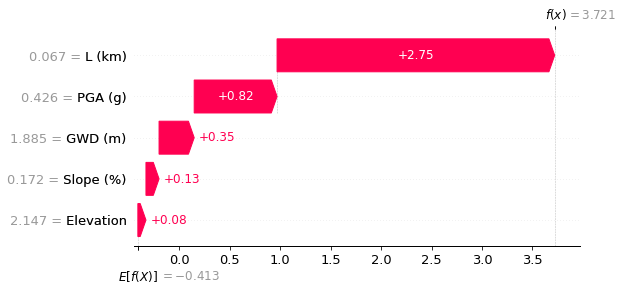

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


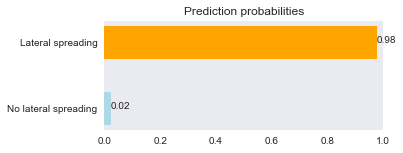

Percentile compare to the overall dataset


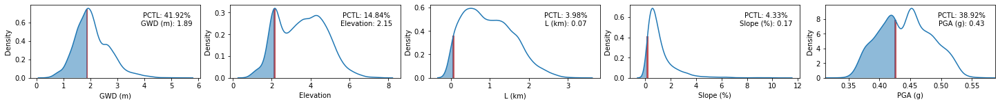

In [386]:
idx = 26
plot_summary(idx, shap_values, X_train)

In [387]:
idx = 26
exp = lm.explain_instance(X_train.iloc[idx], model.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(predict_proba=False)

## Case of no lateral spreading

In [388]:
X_train_target.loc[X_train_target['Target']==0].loc[X_train_target['L (km)'] > 3]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target
60,4097,32250.0,1.023264,4.990308,3.069003,0.109984,0.357425,0
1314,4085,19563.0,1.667777,5.748554,3.289537,0.068539,0.354464,0
2086,4103,16832.0,0.669578,4.666982,3.001999,1.740389,0.362695,0
2768,4100,22454.0,1.058862,5.097780,3.084513,0.768944,0.357425,0


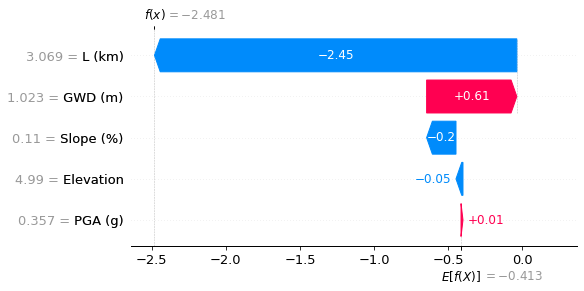

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


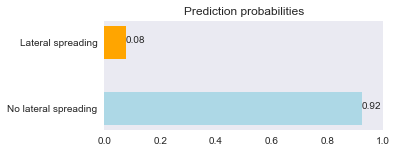

Percentile compare to the overall dataset


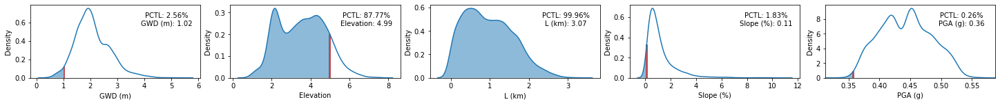

In [389]:
# visualize no lateral spreading prediction explanation
idx = 60
plot_summary(idx, shap_values, X_train)

In [390]:
idx = 60
exp = lm.explain_instance(X_train.iloc[idx], model.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(predict_proba=False)

# Local explanations (Grouped by Type)

## Accuracy

In [391]:
# make prediction
preds = model.predict(X_test)
predictions = [round(value) for value in preds]
# evaluate predictions
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 87.90%


pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


In [392]:
# Create a dataframe with errors
test_targets = X_test_target['Target']
error = predictions - test_targets
testdf = pd.concat([X_test_target, pd.DataFrame({'error':error})], axis=1)

## True Positive

In [393]:
# Target = 1 (lateral spreading)
tp = testdf[testdf['error'] == 0]
tp = tp[tp['Target'] == 1]

X_true_pos = tp.drop(['Test ID', 'Target', 'error'], axis=1)
tp.head()

,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target,error
3630,26109.0,1.790882,3.825384,1.348634,0.262668,0.464188,1,0
5796,28764.0,1.882595,2.106439,0.083856,0.297980,0.446919,1,0
5834,21574.0,1.885435,2.156720,0.075817,0.171548,0.426110,1,0
2704,27657.0,2.522350,4.037776,1.284956,1.072127,0.424088,1,0
2407,2167.0,1.237628,2.838439,0.545491,0.790183,0.461705,1,0


Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


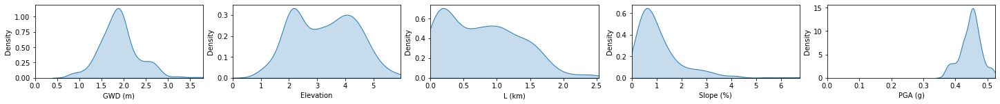

In [394]:
plots.distribution(X_true_pos)

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


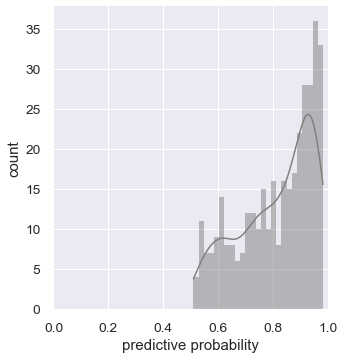

In [395]:
# Prediction probability
prob = model.predict_proba(X_true_pos)
plots.pred_prob(prob[:,1])

In [396]:
# SHAP values of false positive dataset
tp_shap_values = explainer(X_true_pos)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


In [397]:
tp

,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target,error
3630,26109.0,1.790882,3.825384,1.348634,0.262668,0.464188,1,0
5796,28764.0,1.882595,2.106439,0.083856,0.297980,0.446919,1,0
5834,21574.0,1.885435,2.156720,0.075817,0.171548,0.426110,1,0
2704,27657.0,2.522350,4.037776,1.284956,1.072127,0.424088,1,0
2407,2167.0,1.237628,2.838439,0.545491,0.790183,0.461705,1,0
...,...,...,...,...,...,...,...,...
3687,3661.0,2.066567,4.259116,1.556133,1.401959,0.454369,1,0
3060,2485.0,1.963598,3.726254,0.935782,0.630229,0.460277,1,0
5760,25094.0,1.851072,1.893381,0.056673,0.570542,0.446919,1,0
4833,11659.0,2.259502,4.464681,1.100714,1.224963,0.407532,1,0


### Lateral Spreading

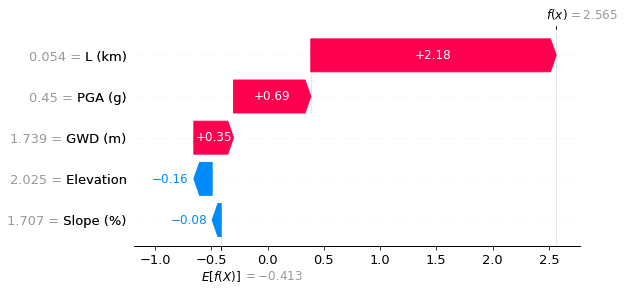

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


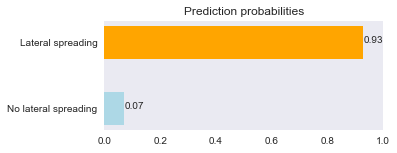

Percentile compare to the overall dataset


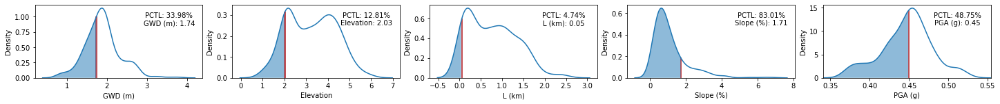

In [398]:
# visualize lateral spreading prediction's explanation
idx = 358
plot_summary(idx, tp_shap_values, X_true_pos)

In [399]:
idx = 358
exp = lm.explain_instance(X_true_pos.iloc[idx], model.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(predict_proba=False, show_all=True)

#### Large distance (L > 2 km), why do we still predict lateral spreading?

In [400]:
tpfar = tp[tp['L (km)'] > 2]
Xfar = tpfar.drop(['Test ID', 'Target', 'error'], axis=1)
tpfar.head()

,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target,error
4110,38514.0,0.805172,4.494415,2.531656,0.502326,0.374701,1,0
4131,16689.0,0.851762,4.310924,2.367820,0.679290,0.377765,1,0
4104,48825.0,0.939028,4.621104,2.374267,0.837824,0.377765,1,0
4777,3781.0,1.710468,4.985128,2.096897,1.343429,0.375793,1,0
4109,48826.0,0.980644,4.616069,2.370803,0.769912,0.377765,1,0


Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


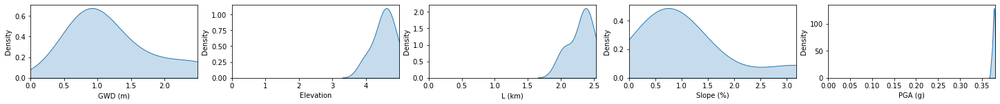

In [401]:
plots.distribution(Xfar)

In [402]:
# SHAP values of X far dataset
xfar_shap_values = explainer(Xfar)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


### Length is > 2.45 kms but the GWD is closer to the surface

In [403]:
tpfar = tpfar.reset_index()
tpfar.loc[tpfar['L (km)']>2.45]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target,error
0,4110,38514.0,0.805172,4.494415,2.531656,0.502326,0.374701,1,0


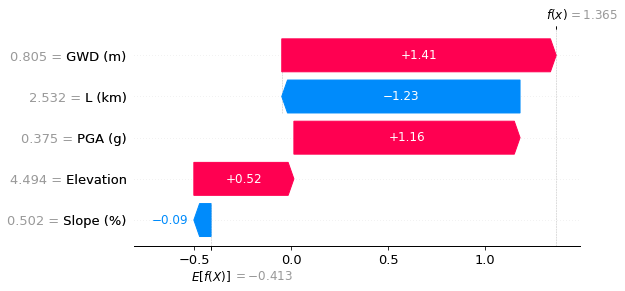

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


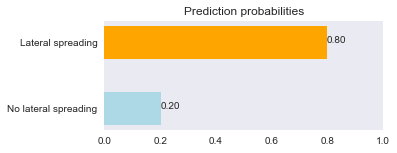

Percentile compare to the overall dataset


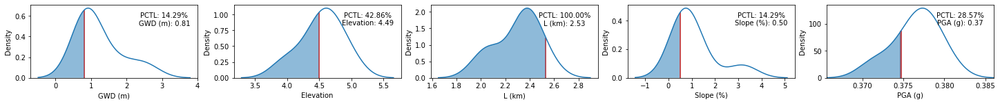

In [404]:
# visualize lateral spreading prediction's explanation
idx = 0
plot_summary(idx, xfar_shap_values, Xfar)

In [405]:
idx = 0
exp = lm.explain_instance(Xfar.iloc[idx], model.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(predict_proba=False, show_all=True)

### GWD is deep

In [406]:
tpfar.loc[tpfar['GWD (m)'] > 2]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target,error
6,1605,37331.0,2.493565,4.770171,2.01594,3.180131,0.371414,1,0


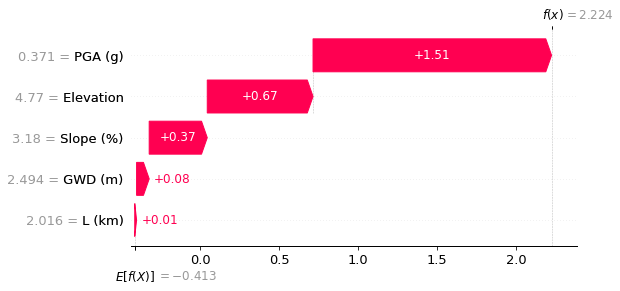

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


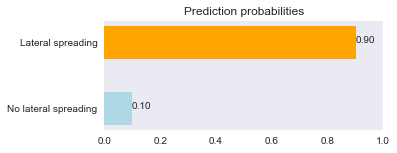

Percentile compare to the overall dataset


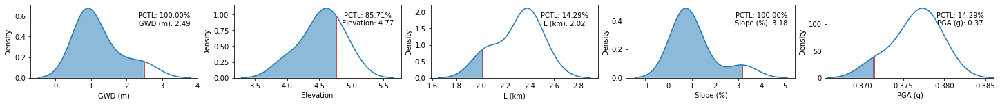

In [407]:
idx = 6
plot_summary(idx, xfar_shap_values, Xfar)

In [408]:
idx = 0
exp = lm.explain_instance(Xfar.iloc[idx], model.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(predict_proba=False, show_all=True)

## True Negative

In [409]:
# Target = 0 (no-lateral spreading)
tn = testdf[testdf['error'] == 0]
tn = tn[tn['Target'] == 0]

X_true_neg = tn.drop(['Test ID', 'Target', 'error'], axis=1)
tn = tn.reset_index()
tn.head()

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target,error
0,161,38414.0,2.018221,2.782394,0.681779,0.632241,0.419531,0,0
1,1643,32907.0,2.778554,4.800351,1.450625,0.993102,0.386724,0,0
2,119,513.0,1.605895,3.570586,2.199005,0.237995,0.377088,0,0
3,4321,34314.0,2.248602,5.811677,2.622328,0.274640,0.366673,0,0
4,6297,37672.0,2.057632,2.245837,0.284873,0.111626,0.447333,0,0


Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


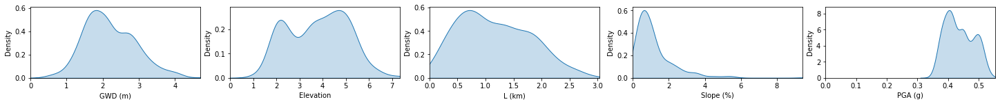

In [410]:
plots.distribution(X_true_neg)

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


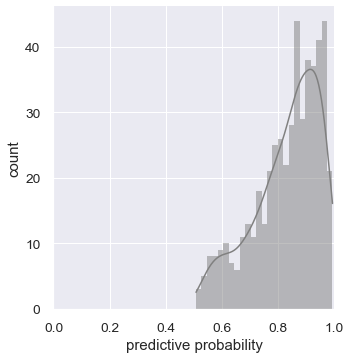

In [411]:
# Prediction probability
prob = model.predict_proba(X_true_neg)
plots.pred_prob(prob[:,0])

In [412]:
# SHAP values of X far dataset
tn_shap_values = explainer(X_true_neg)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


### No lateral spreading due to far away distance

In [413]:
tn.loc[tn['L (km)'] > 2].head()

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target,error
2,119,513.0,1.605895,3.570586,2.199005,0.237995,0.377088,0,0
3,4321,34314.0,2.248602,5.811677,2.622328,0.274640,0.366673,0,0
11,4428,37710.0,1.829858,5.426878,2.068942,0.791967,0.381214,0,0
14,4105,32251.0,1.017751,4.782964,3.034131,0.480071,0.359753,0,0
20,4090,37128.0,0.509307,4.509655,2.809299,1.173059,0.366222,0,0


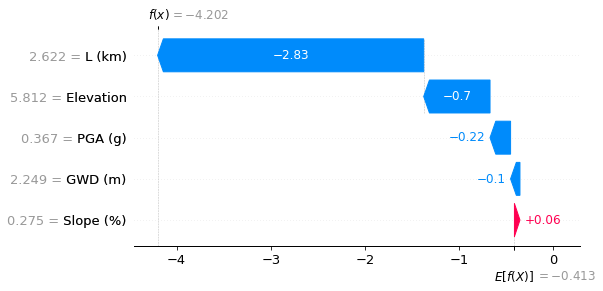

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


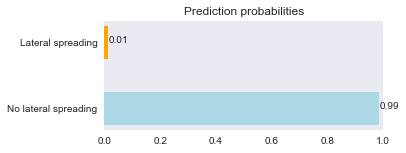

Percentile compare to the overall dataset


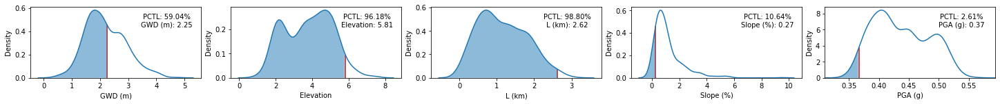

In [414]:
plot_summary(3, tn_shap_values, X_true_neg)

### True negative at short distances (L)

In [415]:
tn.loc[tn['L (km)'] < 0.5].loc[tn['GWD (m)'] > 3]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target,error
21,1805,25621.0,3.443651,3.972750,0.169952,1.890133,0.426905,0,0
35,1558,12460.0,3.095618,3.997163,0.421687,1.024821,0.413012,0,0
214,919,17611.0,3.370925,3.600594,0.386230,0.619478,0.476612,0,0
241,1386,37741.0,3.456206,3.693008,0.169971,3.791025,0.408041,0,0
253,257,15617.0,3.809646,4.403340,0.181716,1.720116,0.449553,0,0
265,912,17484.0,3.317045,3.609877,0.452786,0.847155,0.474041,0,0
364,5107,46042.0,3.019693,4.285464,0.335411,0.392997,0.438655,0,0
392,5074,5970.0,3.044290,4.290203,0.287614,0.383352,0.439723,0,0


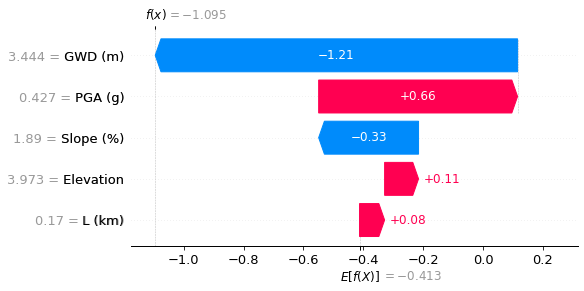

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


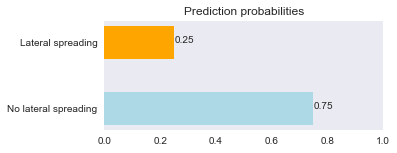

Percentile compare to the overall dataset


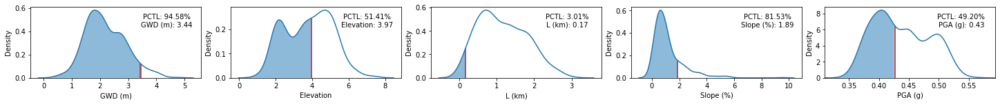

In [416]:
# visualize no lateral spreading prediction's explanation (3)
idx = 21
plot_summary(idx, tn_shap_values, X_true_neg)

#### High PGAs

In [417]:
tn.loc[tn['PGA (g)'] > 0.5].head()

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target,error
6,4009,50901.0,1.298123,1.661698,0.156107,0.362469,0.510675,0,0
9,895,11469.0,2.475069,3.624193,1.567143,1.182557,0.501357,0,0
13,3999,25099.0,1.203455,1.386256,0.044550,0.604013,0.515968,0,0
18,6479,6273.0,2.785572,1.959809,0.894703,0.606944,0.506586,0,0
27,4080,23592.0,3.226952,3.534300,0.908773,0.628626,0.524547,0,0


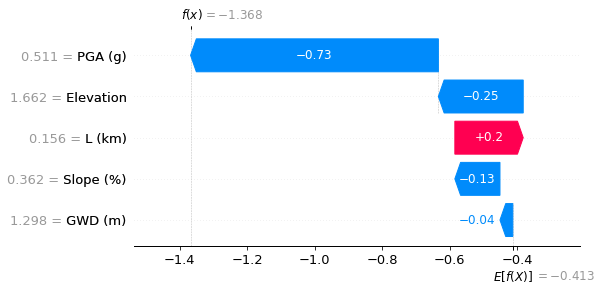

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


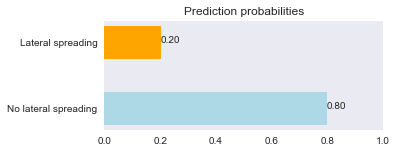

Percentile compare to the overall dataset


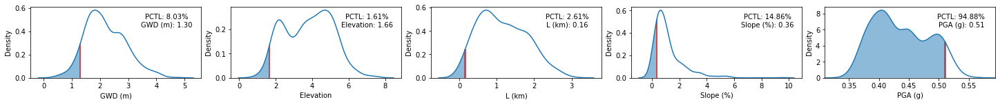

In [418]:
plot_summary(6, tn_shap_values, X_true_neg)

# False positive

In [419]:
# Error is 1 means prediction 1 (lateral spreading) while target is 0 (no-lateral spreading)
fp = testdf[testdf['error'] == 1]
X_false_pos = fp.drop(['Test ID', 'Target', 'error'], axis=1)
fp = fp.reset_index()
fp.head()

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target,error
0,2850,2556.0,2.249877,4.979225,0.984994,2.167620,0.450196,0,1
1,6300,15303.0,2.010932,2.136515,0.205895,1.333204,0.447333,0,1
2,4108,32511.0,0.808329,4.335538,2.529715,0.395249,0.374701,0,1
3,3094,37532.0,2.487671,3.958574,1.492929,1.000127,0.426441,0,1
4,3879,33830.0,2.408835,4.481244,1.687515,0.531799,0.463272,0,1


Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


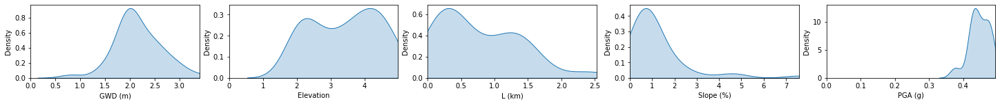

In [420]:
plots.distribution(X_false_pos)

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


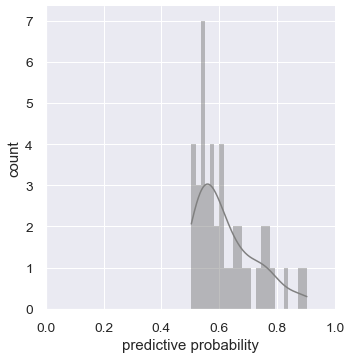

In [421]:
# Prediction probability
prob = model.predict_proba(X_false_pos)
plots.pred_prob(prob[:,1])

In [422]:
# SHAP values of false positive dataset
fp_shap_values = explainer(X_false_pos)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


## Fails for close distance to river

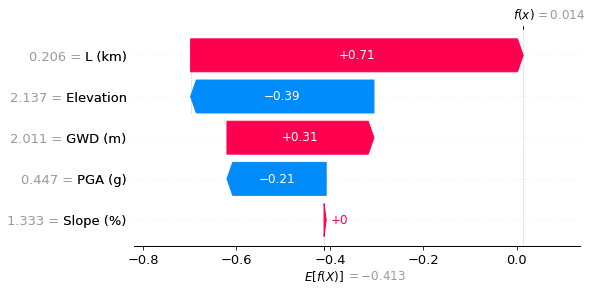

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


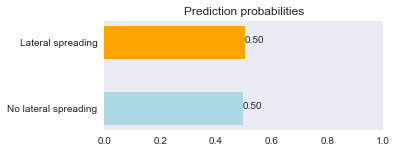

Percentile compare to the overall dataset


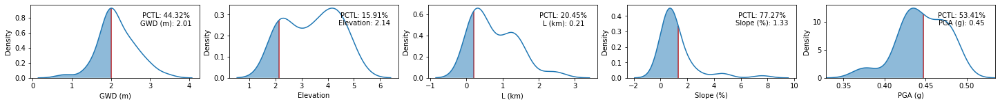

In [423]:
# visualize lateral spreading prediction's explanation - The elevation and slope values are zero
idx=1
plot_summary(idx, fp_shap_values, X_false_pos)

In [424]:
fp.loc[fp['Slope (%)'] > 4]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target,error
13,5151,3764.0,2.580149,3.688236,0.257180,4.580277,0.438655,0,1
30,5992,14096.0,2.640565,3.118182,0.035327,4.665368,0.424457,0,1
35,1693,24603.0,2.401103,4.577996,2.296437,7.587110,0.370285,0,1


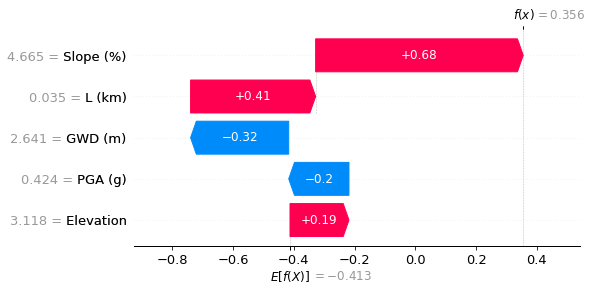

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


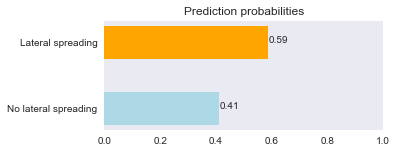

Percentile compare to the overall dataset


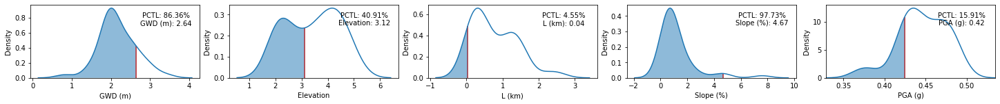

In [425]:
plot_summary(30, fp_shap_values, X_false_pos)

## High PGA triggered a false positive

In [426]:
fp.loc[fp['PGA (g)'] > 0.48]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target,error
12,318,6586.0,1.963472,3.191601,0.702210,2.101618,0.480628,0,1
28,6469,6382.0,2.012480,2.290233,0.337728,0.843485,0.493458,0,1
33,6463,4655.0,1.920849,2.231472,0.100569,0.448746,0.484333,0,1
36,3347,4338.0,1.952008,2.848418,0.396222,0.753769,0.484773,0,1
37,6471,41753.0,1.963074,2.113992,0.136752,0.341582,0.490144,0,1


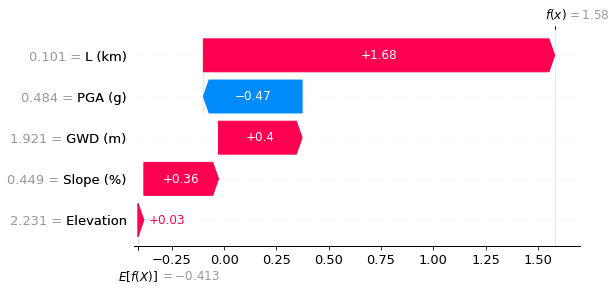

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


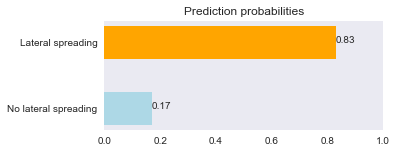

Percentile compare to the overall dataset


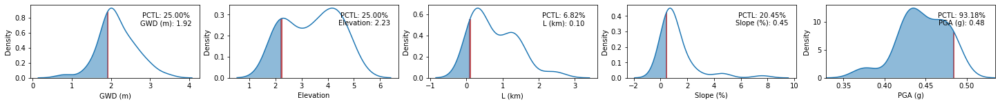

In [427]:
plot_summary(33, fp_shap_values, X_false_pos)

### Low PGAs triggering liquefaction all these points are at high elevation

In [428]:
fp.loc[fp['PGA (g)'] < 0.4]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target,error
2,4108,32511.0,0.808329,4.335538,2.529715,0.395249,0.374701,0,1
35,1693,24603.0,2.401103,4.577996,2.296437,7.587110,0.370285,0,1
42,1653,32906.0,2.737708,4.991457,1.477740,0.596577,0.386724,0,1


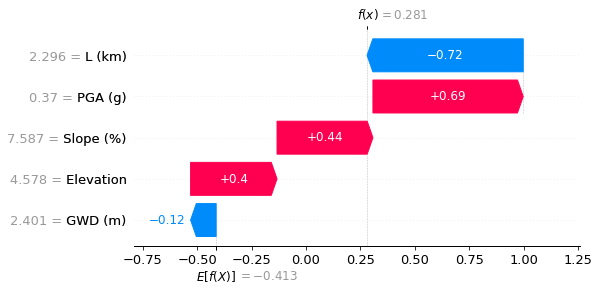

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


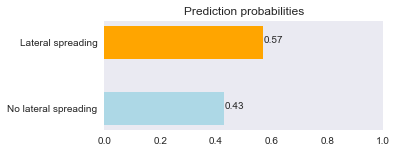

Percentile compare to the overall dataset


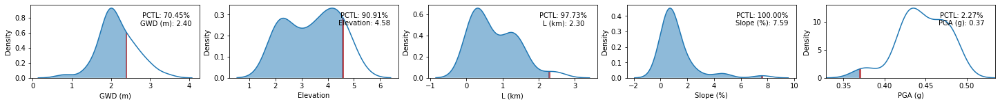

In [429]:
plot_summary(35, fp_shap_values, X_false_pos)

# False negatives

In [430]:
# Error is -1 means prediction 0 (no-lateral spreading) while target is 1 (lateral spreading)
fn = testdf[testdf['error'] == -1]

X_false_neg = fn.drop(['Test ID', 'Target', 'error'], axis=1)
fn = fn.reset_index()
fn.head()

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target,error
0,5640,15700.0,0.776125,1.867309,0.463957,0.338019,0.446241,1,-1
1,6004,38301.0,3.475307,3.356515,0.044242,3.295177,0.424457,1,-1
2,2380,27611.0,1.587372,3.501283,1.843400,0.541324,0.408893,1,-1
3,706,9056.0,2.109729,2.325703,0.333431,0.579430,0.453837,1,-1
4,274,41570.0,3.336766,4.845207,0.588120,3.652974,0.485805,1,-1


pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


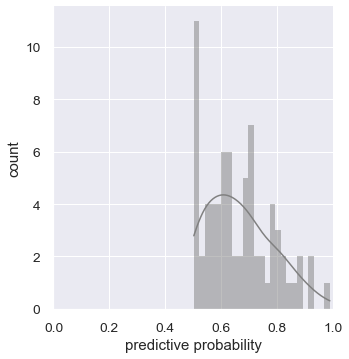

In [431]:
# Prediction probability
prob = model.predict_proba(X_false_neg)
plots.pred_prob(prob[:,0])

In [432]:
# SHAP values of false negative dataset
fn_shap_values = explainer(X_false_neg)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


### Distance is too far

In [433]:
fn.loc[fn['L (km)'] > 2]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target,error
10,4116,34718.0,1.027273,4.724062,2.233438,0.506840,0.377765,1,-1
12,4774,5269.0,1.721808,4.690317,2.101612,0.719466,0.378829,1,-1
13,6609,48656.0,2.302286,5.847261,2.739961,0.545546,0.364377,1,-1
64,1690,24628.0,2.314934,4.429238,2.317660,2.562188,0.368342,1,-1


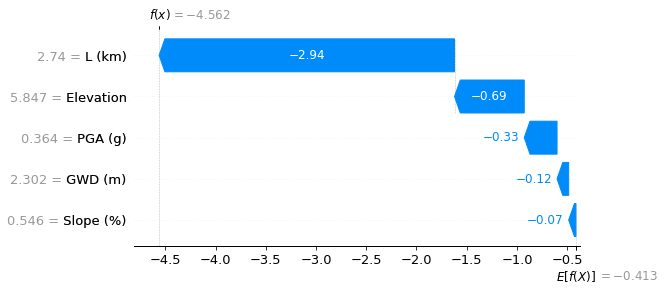

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


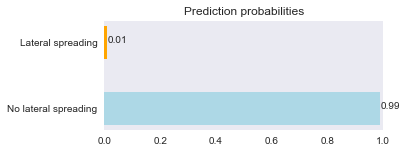

Percentile compare to the overall dataset


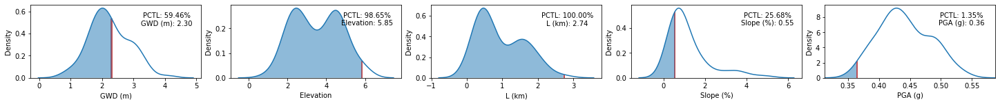

In [434]:
# The elevation and slope values are zero
idx=13
plot_summary(idx, fn_shap_values, X_false_neg)

### Distance is close but predicts false negative value

In [435]:
fn.loc[fn['L (km)'] < 0.5]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target,error
0,5640,15700.0,0.776125,1.867309,0.463957,0.338019,0.446241,1,-1
1,6004,38301.0,3.475307,3.356515,0.044242,3.295177,0.424457,1,-1
3,706,9056.0,2.109729,2.325703,0.333431,0.579430,0.453837,1,-1
5,3926,15638.0,1.509374,1.018703,0.341521,0.773092,0.514378,1,-1
6,6,161.0,1.884515,1.692008,0.064009,0.173425,0.535902,1,-1
8,6355,28953.0,1.872189,1.954347,0.261155,1.020559,0.449792,1,-1
15,6360,28952.0,2.083289,2.315980,0.290537,0.426429,0.449792,1,-1
16,6031,5060.0,2.109565,2.485610,0.477694,0.505582,0.464307,1,-1
17,733,22278.0,2.174715,2.357587,0.374807,1.209491,0.459658,1,-1
18,5269,25157.0,3.039519,4.256782,0.412140,0.721181,0.425758,1,-1


### Deeper GWD

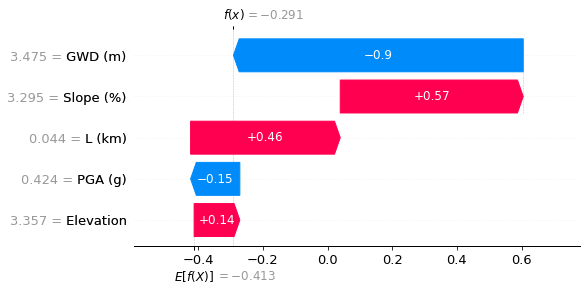

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


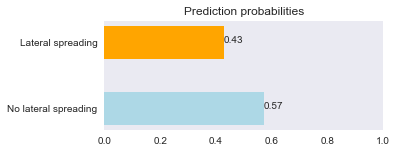

Percentile compare to the overall dataset


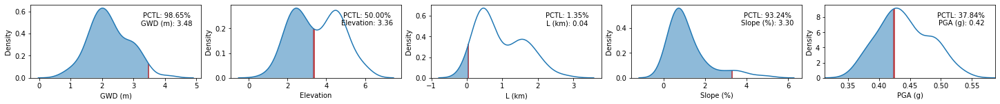

In [436]:
plot_summary(1, fn_shap_values, X_false_neg)

#### Shallow GWD < 2m 

In [437]:
fn.loc[fn['L (km)'] < 0.5].loc[fn['GWD (m)'] < 2]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target,error
0,5640,15700.0,0.776125,1.867309,0.463957,0.338019,0.446241,1,-1
5,3926,15638.0,1.509374,1.018703,0.341521,0.773092,0.514378,1,-1
6,6,161.0,1.884515,1.692008,0.064009,0.173425,0.535902,1,-1
8,6355,28953.0,1.872189,1.954347,0.261155,1.020559,0.449792,1,-1
23,188,48147.0,1.082345,1.651046,0.436470,1.148642,0.421927,1,-1
24,6274,25697.0,1.676958,2.153806,0.487379,0.965374,0.448203,1,-1
29,6328,27347.0,1.850813,2.053900,0.205620,0.262268,0.449792,1,-1
36,1992,32959.0,1.930622,2.487270,0.465034,0.900893,0.428506,1,-1
44,6337,31664.0,1.783756,2.093882,0.329963,0.335633,0.449792,1,-1
45,1996,4627.0,1.960416,2.502589,0.499831,0.997651,0.425247,1,-1


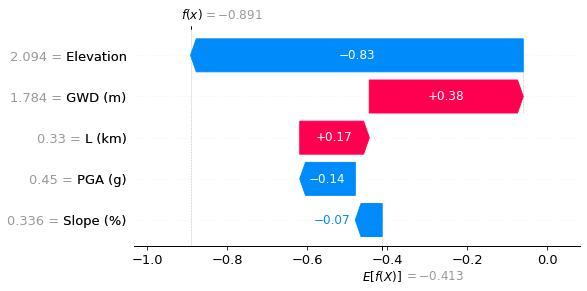

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


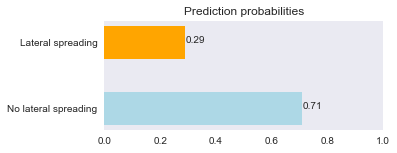

Percentile compare to the overall dataset


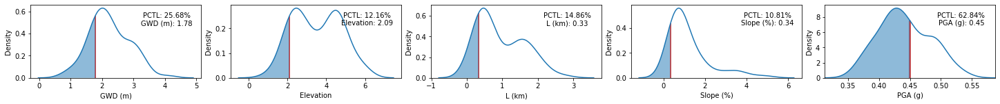

In [438]:
idx = 44
plot_summary(idx, fn_shap_values, X_false_neg)

### Where high PGA affects the results

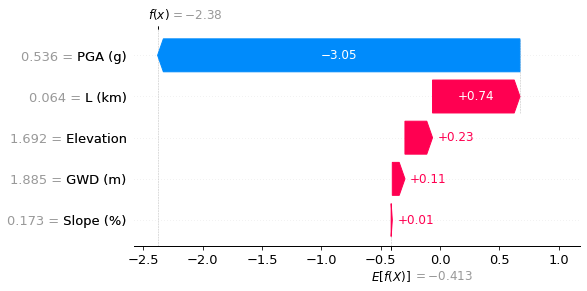

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


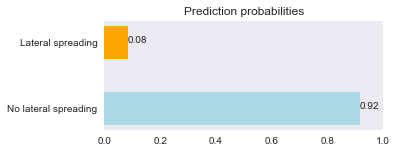

Percentile compare to the overall dataset


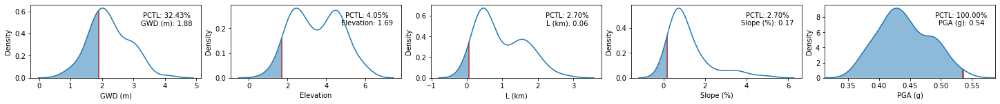

In [439]:
idx = 6
plot_summary(idx, fn_shap_values, X_false_neg)

# Global explanations

Text(0.5, 0, 'Feature importance')

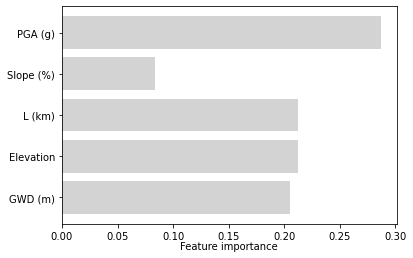

In [440]:
plt.barh(['GWD (m)', 'Elevation', 'L (km)', 'Slope (%)', 'PGA (g)'], model.feature_importances_, color='lightgray')
plt.xlabel("Feature importance", labelpad=0.1)

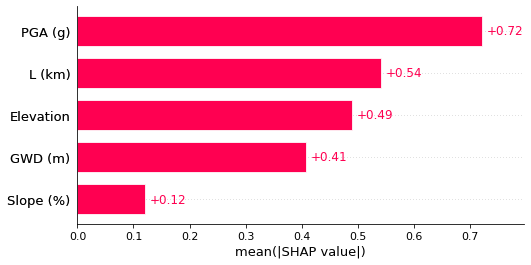

In [441]:
shap.plots.bar(shap_values)

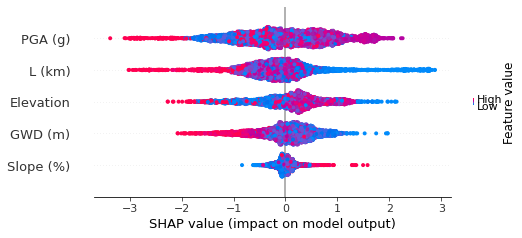

In [442]:
# summarize the effects of all the features
shap.plots.beeswarm(shap_values)

## True Positives

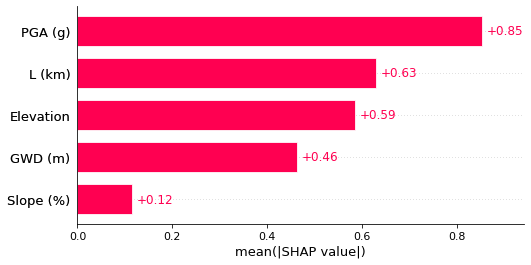

In [443]:
shap.plots.bar(tp_shap_values)

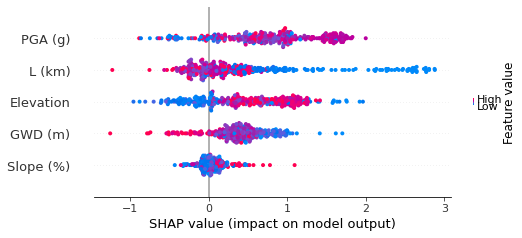

In [444]:
# summarize the effects of all the features
shap.plots.beeswarm(tp_shap_values)

### True negative

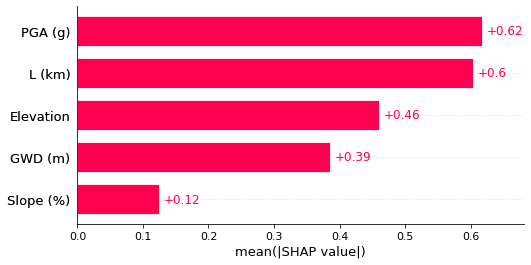

In [445]:
shap.plots.bar(tn_shap_values)

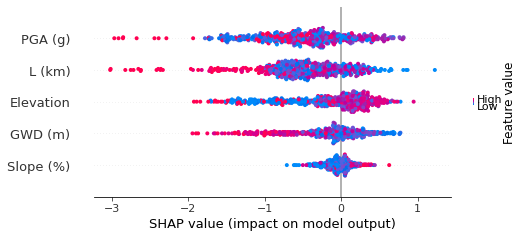

In [446]:
shap.plots.beeswarm(tn_shap_values)

### False positives

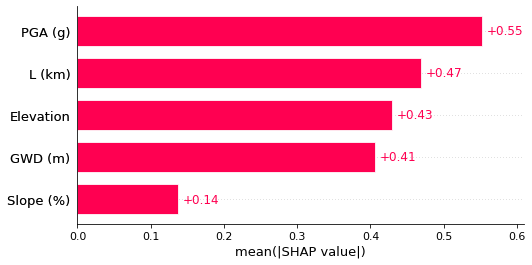

In [447]:
shap.plots.bar(fp_shap_values)

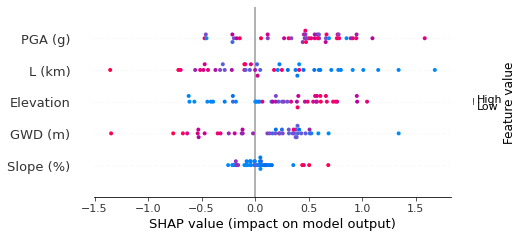

In [448]:
shap.plots.beeswarm(fp_shap_values)

### False Negative

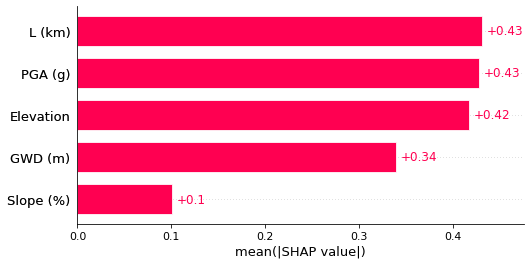

In [449]:
shap.plots.bar(fn_shap_values)

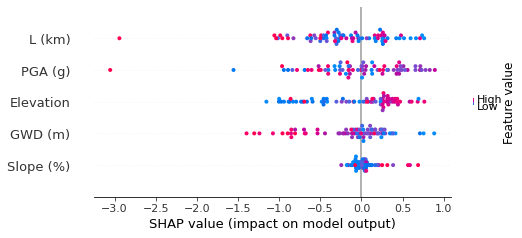

In [450]:
shap.plots.beeswarm(fn_shap_values)

# Feature relations

In [451]:
shap_values = explainer(X_train)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


In [452]:
# explain the model's predictions using SHAP
# compute SHAP values
explainer = shap.TreeExplainer(model)
shap_values = explainer(X_train)
#shap.dependence_plot('PGA (g)', shap_values, X_train, interaction_index="Elevation")

In [453]:
shap_values = explainer(X_train) 

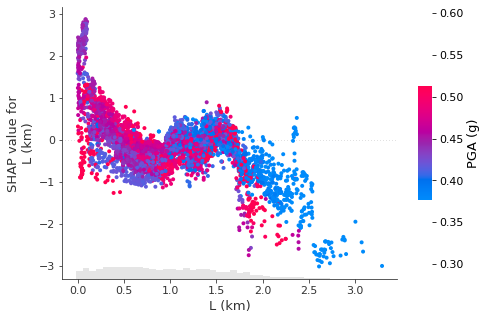

In [454]:
# create a dependence scatter plot to show the effect of a single feature across the whole dataset
shap.plots.scatter(shap_values[:,"L (km)"], color=shap_values)

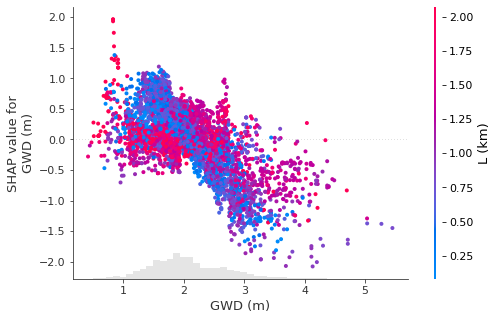

In [455]:
shap.plots.scatter(shap_values[:,"GWD (m)"], color=shap_values)

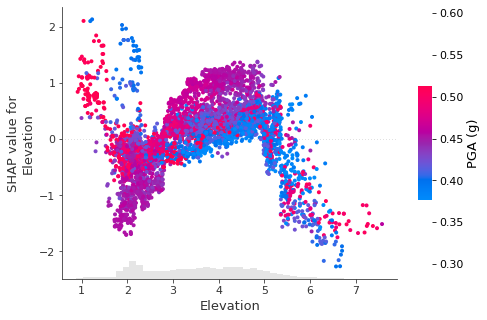

In [456]:
shap.plots.scatter(shap_values[:,"Elevation"], color=shap_values)

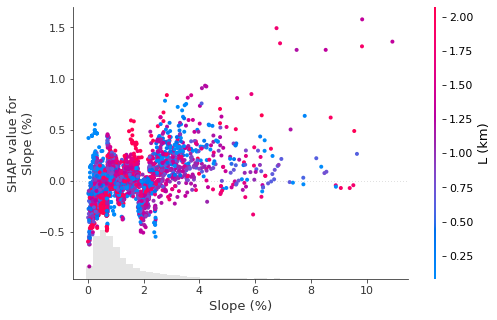

In [457]:
shap.plots.scatter(shap_values[:,"Slope (%)"], color=shap_values)

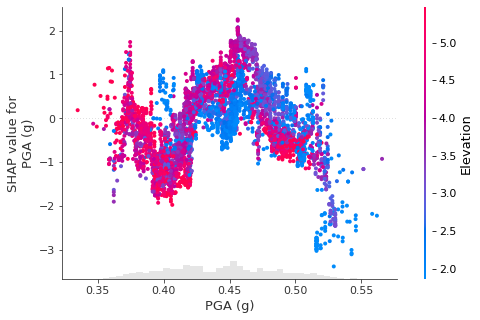

In [458]:
shap.plots.scatter(shap_values[:,"PGA (g)"], color=shap_values)

## Relation plots

### Scatter plot of GWD (m) vs SHAP values

The GWD is the first column of the SHAP values matrix.

In [459]:
shap_values = explainer(X_train)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


In [460]:
# GWD datset
gwd = shap_values.data[:,0]
gwd_shap = shap_values.values[:,0]
gwd_shap_dataset = np.array(list(zip(gwd, gwd_shap)))
target = X_train_target['Target']

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


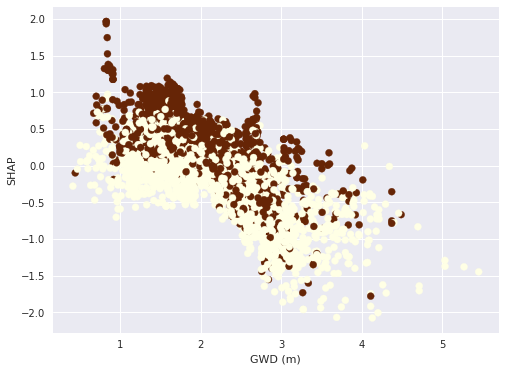

In [461]:
with plt.style.context(('ggplot', 'seaborn')):
    plt.figure(figsize=(8,6))
    plt.scatter(gwd, gwd_shap, c=target, cmap='YlOrBr')

    plt.xlabel('GWD (m)')
    plt.ylabel('SHAP')
    plt.legend(loc='best')

### Distance to river

In [462]:
shap_values = explainer(X_train)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


In [463]:
# GWD datset
l = shap_values.data[:,2]
l_shap = shap_values.values[:,2]
l_shap_dataset = np.array(list(zip(l, l_shap)))
target = X_train_target['Target']

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


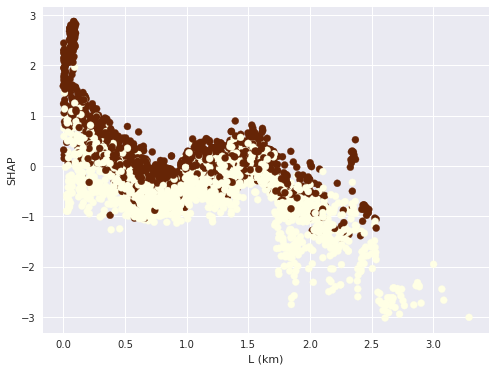

In [464]:
with plt.style.context(('ggplot', 'seaborn')):
    plt.figure(figsize=(8,6))
    plt.scatter(l, l_shap, c=target, cmap='YlOrBr')

    plt.xlabel('L (km)')
    plt.ylabel('SHAP')
    plt.legend(loc='best')

### PGA SHAP values

In [465]:
# GWD datset
pga = shap_values.data[:,4]
pga_shap = shap_values.values[:,4]
pga_shap_dataset = np.array(list(zip(pga, pga_shap)))
target = X_train_target['Target']

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


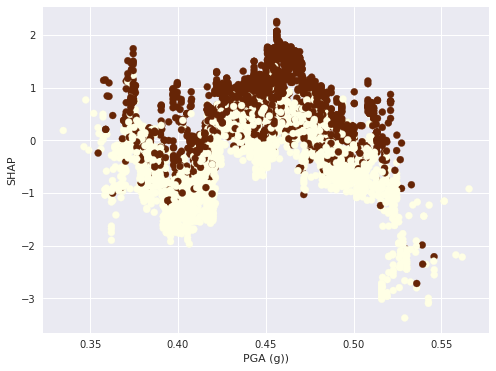

In [466]:
with plt.style.context(('ggplot', 'seaborn')):
    plt.figure(figsize=(8,6))
    plt.scatter(pga, pga_shap, c=target, cmap='YlOrBr')

    plt.xlabel('PGA (g))')
    plt.ylabel('SHAP')
    plt.legend(loc='best')

## Slope

In [467]:
# GWD datset
slope = shap_values.data[:,3]
slope_shap = shap_values.values[:,3]
slope_shap_dataset = np.array(list(zip(pga, pga_shap)))
target = X_train_target['Target']

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


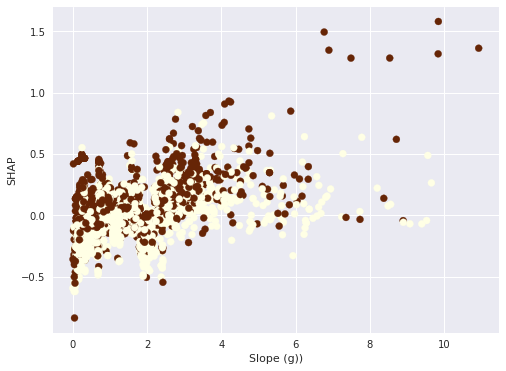

In [468]:
with plt.style.context(('ggplot', 'seaborn')):
    plt.figure(figsize=(8,6))
    plt.scatter(slope, slope_shap, c=target, cmap='YlOrBr')

    plt.xlabel('Slope (g))')
    plt.ylabel('SHAP')
    plt.legend(loc='best')

# Specific sites

### False negative - 24628

In [470]:
d = X_test_target[X_test_target['Test ID'] == 24628.0]
d = d.drop(['Test ID', 'Target'], axis=1)
print("Target 1: prediction: ", model.predict(d), model.predict_proba(d))

Target 1: prediction:  [0] [[0.6872867  0.31271333]]


pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


In [471]:
fn[fn['Test ID'] == 24628.0]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target,error
64,1690,24628.0,2.314934,4.429238,2.31766,2.562188,0.368342,1,-1


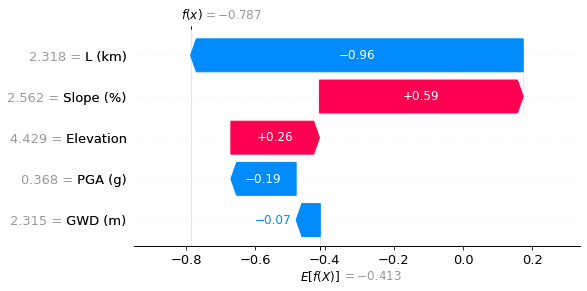

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


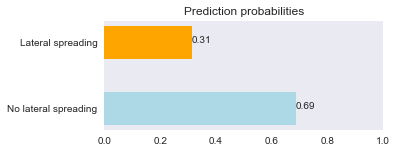

Percentile compare to the overall dataset


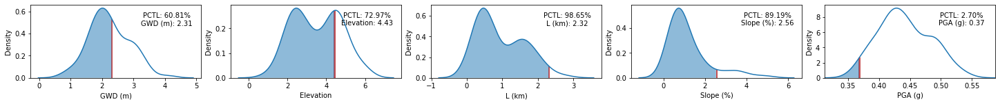

In [472]:
plot_summary(64, fn_shap_values, X_false_neg)

#### False Positive site - 38414

In [474]:
d = X_test_target[X_test_target['Test ID'] == 38414.0]
d = d.drop(['Test ID', 'Target'], axis=1)
print("Target 0: prediction: ", model.predict(d), model.predict_proba(d))

Target 0: prediction:  [0] [[0.8977511  0.10224894]]


pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


In [479]:
tn[tn['Test ID'] == 38414.0]

,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target,error
0,161,38414.0,2.018221,2.782394,0.681779,0.632241,0.419531,0,0


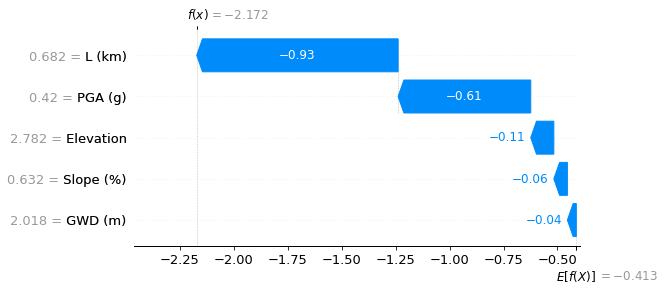

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


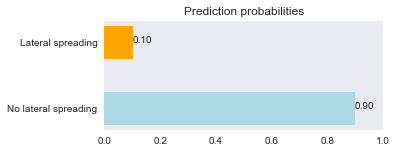

Percentile compare to the overall dataset


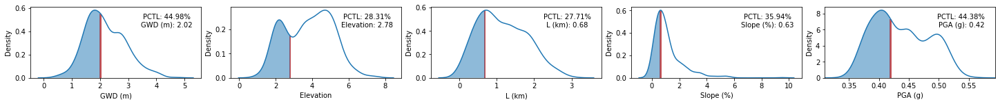

In [482]:
plot_summary(0, tn_shap_values, X_true_neg)

### True Positive 38514.0


In [488]:
d = X_test_target[X_test_target['Test ID'] == 38514.0]
d = d.drop(['Test ID', 'Target'], axis=1)
print("Target 1: prediction: ", model.predict(d), model.predict_proba(d))

Target 1: prediction:  [1] [[0.20345116 0.79654884]]


pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


In [492]:
tpx = tp.reset_index()
tpx[tpx['Test ID'] == 38514.0]


,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target,error
21,4110,38514.0,0.805172,4.494415,2.531656,0.502326,0.374701,1,0


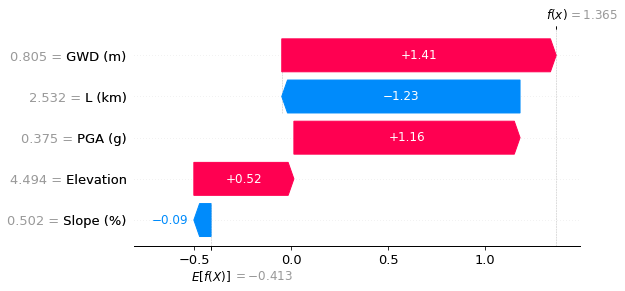

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


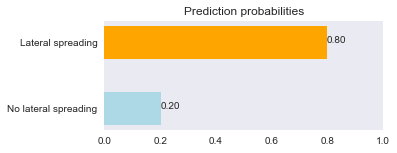

Percentile compare to the overall dataset


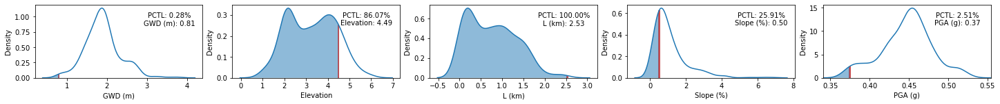

In [493]:
plot_summary(21, tp_shap_values, X_true_pos)

#### True negative - 25621.0

In [494]:
d = X_test_target[X_test_target['Test ID'] == 25621.0]
d = d.drop(['Test ID', 'Target'], axis=1)
print("Target 0: prediction: ", model.predict(d), model.predict_proba(d))

Target 0: prediction:  [0] [[0.7494104  0.25058958]]


pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


In [496]:
tn[tn['Test ID'] == 25621.0]


,index,Test ID,GWD (m),Elevation,L (km),Slope (%),PGA (g),Target,error
21,1805,25621.0,3.443651,3.97275,0.169952,1.890133,0.426905,0,0


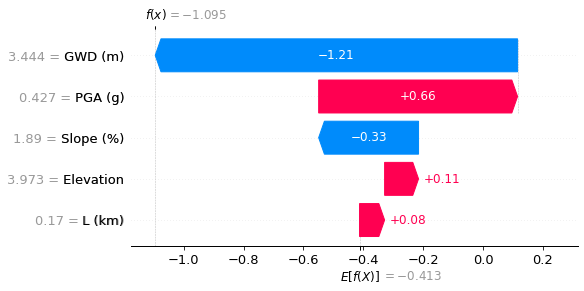

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


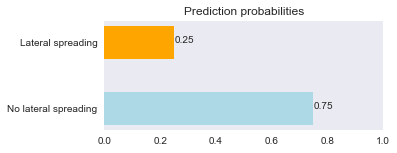

Percentile compare to the overall dataset


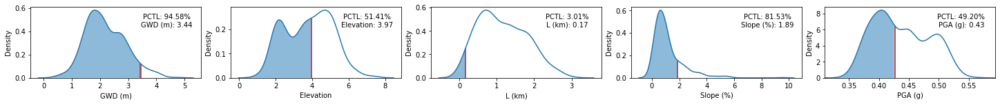

In [497]:
plot_summary(21, tn_shap_values, X_true_neg)

#### False Positive - 2556

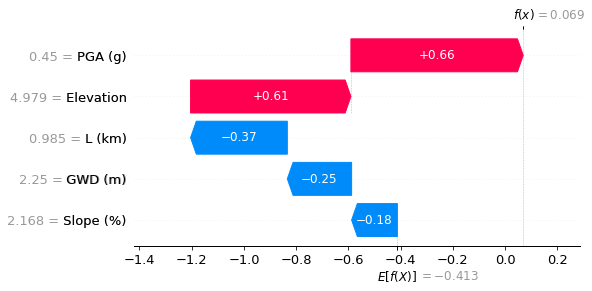

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


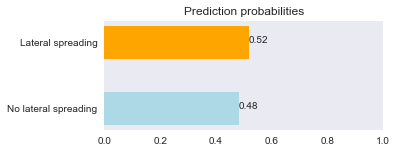

Percentile compare to the overall dataset


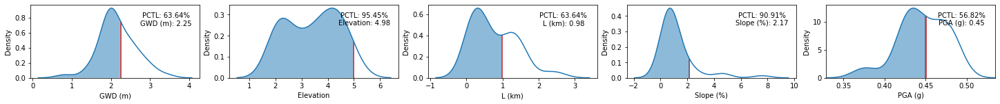

In [499]:
# visualize lateral spreading prediction's explanation - The elevation and slope values are zero
plot_summary(0, fp_shap_values, X_false_pos)

#### Bad Learning - 38301

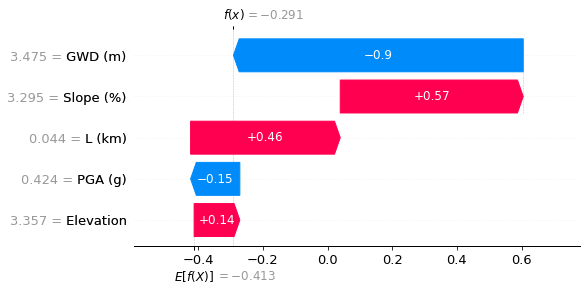

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


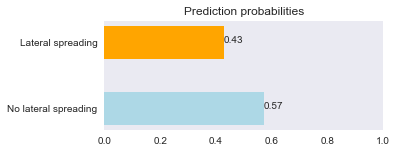

Percentile compare to the overall dataset


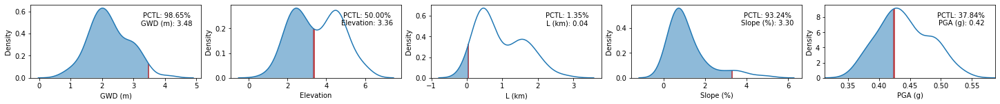

In [500]:
# visualize lateral spreading prediction's explanation - The elevation and slope values are zero
plot_summary(1, fn_shap_values, X_false_neg)